In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import numpy as np

# Load the data
df = pd.read_csv('/Users/sterling/Documents/simpleDmca/PumpFun/pump-fun-bot/data/transactions5000.csv')

# Ensure the 'Date' is a pandas datetime object
df['Date'] = pd.to_datetime(df['Date'])

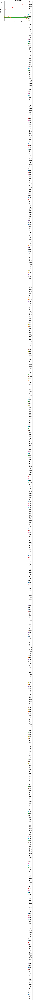

In [2]:
# Prepare a plot
plt.figure(figsize=(12, 8))

# Iterate through each group (each unique coin)
for mint, group in df.groupby('Mint'):
    # Sort by date and reset index
    group = group.sort_values('Date').reset_index(drop=True)
    
    # Create a time index relative to the first transaction
    group['Time Since First'] = (group['Date'] - group['Date'].min()).dt.total_seconds()
    
    # Filter for the first 30 minutes (2400 seconds)
    filtered_group = group[group['Time Since First'] <= 2400]
    
    # Ensure there are enough points to do regression
    if len(filtered_group) > 1:
        # Linear Regression to find trendline
        X = filtered_group['Time Since First'].values.reshape(-1, 1)
        y = filtered_group['THS USD Price'].values
        model = LinearRegression()
        model.fit(X, y)
        trendline = model.predict(X)

        # Plot the trendline
        plt.plot(filtered_group['Time Since First'] / 60, trendline, label=f'{mint[:8]}...')

# Customize the plot
plt.xlabel('Time Since First Transaction (hours)')
plt.ylabel('THS USD Price')
plt.title('Trendlines of THS USD Price for Each Coin')
plt.legend()
plt.grid(True)
plt.show()

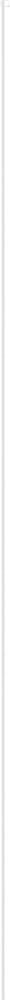

In [3]:
for mint, group in df.groupby('Mint'):
    group = group.sort_values('Date')
    group['Moving Avg'] = group['THS USD Price'].rolling(window=5).mean()
    
    plt.plot(group['Date'], group['THS USD Price'], label=f'{mint[:8]} Prices')
    plt.plot(group['Date'], group['Moving Avg'], label=f'{mint[:8]} Moving Avg', linestyle='--')

plt.legend()
plt.title('Price Trends with Moving Averages')
plt.xlabel('Date')
plt.ylabel('THS USD Price')
plt.show()

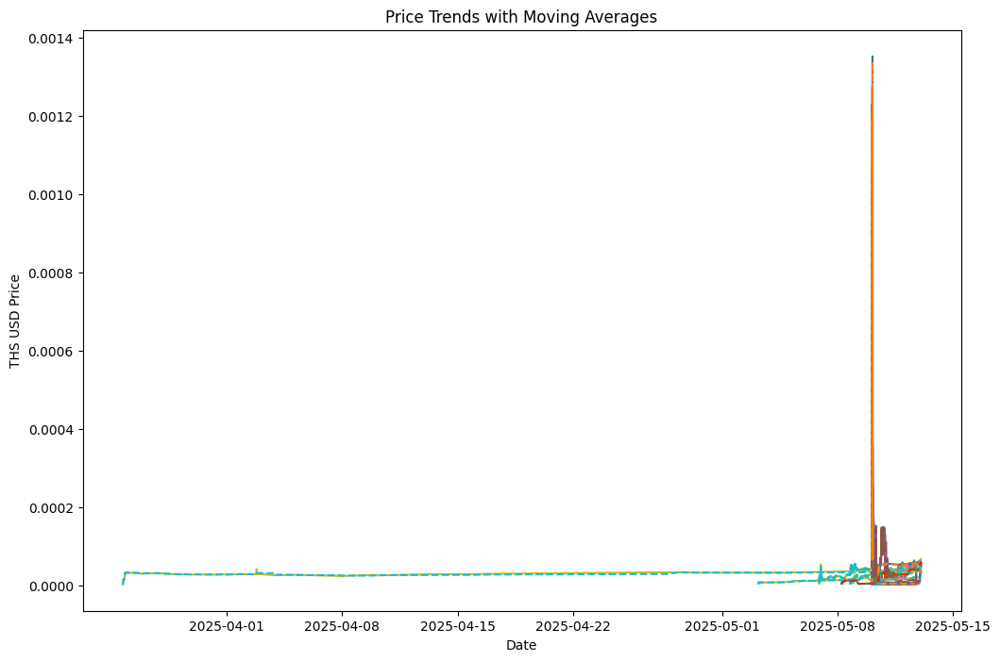

Coins with overall average price higher than the mean of their first 10 trades:
2BVSuxkbL8YBAmawvC7tgwkJGUEhZDkr82xoVUxzpump
2JpN3THfGJqdMHFU5kPFmZm86QQoRVyHKuimA471pump
2MZnTQfa4Ve8FmkMwqn7Xnjbsj6BWXGtLHghmdcnpump
2SidXT8dNA9mF5wdDVa8J7fUJhyMpGtzxdjH6MYipump
2UcnSDD8AyhAmPWjmTxjL6j1HZy3831xQvF89qbfpump
2WDxSV57rVQCco5EEt34WbdcTh9VFVXD14sPoSqKpump
2Ww1qYvrEz2mDWXM7ukQ1HzzpE53Jxv2kyM4xNk7pump
2iv9U3DztiDH17cQDC8vBSxP89QPVW68HEN2CPdcpump
2kmqhaoFdUF6QFsZiLUgv3hWrx6ZsJG9ywxwB8mcpump
2maJVvwqxrftnYNLftHB4SSfnWY2rRwBshXt5kmnpump
2oZvzy3tn2UD7M4H8EaJ53w7uqYNihgHjkwVUEDapump
2t4FGVHRFZKUuRcqZXe6AKUzVidTM17UUTuj5syfpump
2vhFYYYjMRj2Jpi5gpaQXCzQ54LGyNM5wipuGYE2pump
36D21NSYjgYL45fuBG4TKuWHYTywKFJ9GM6LRA45pump
37fZsQgTn3feJ2oGWpKL2RvndX3D5rrBTzWTWpwWpump
3E8THa4AAZCtv88Tcr377zYtcvBMXoWVUswTx6qhpump
3JkdcmE2QgEoLDdNkGYA2n7qaQuUiDJwMXAfvXbRpump
3LKqHeS5mXXYUKDq1Y5Wtqnn7xy4V19fo2PUnQJspump
3gskZ1VW1c9q3gE31AHy5e3KzsGcAm9pAcHYJor6pump
3jXF2eqa1UFfHYVWhyxSWSRDpSUc8Huybni2xYKipump
3oGgPuobfdbfELqokBdH

In [4]:
# Store coins with higher average price
coins_higher_than_first_10_mean = []

# Plot setup
plt.figure(figsize=(12, 8))

# Iterate through each group (each unique coin)
for mint, group in df.groupby('Mint'):
    group = group.sort_values('Date').reset_index(drop=True)
    
    # Calculate the mean of the first 10 trades
    if len(group) >= 10:
        first_10_mean = group['THS USD Price'].iloc[:10].mean()
        
        # Calculate overall average price
        overall_avg_price = group['THS USD Price'].mean()
        
        # Check if the overall average is greater than the first 10 mean
        if overall_avg_price > first_10_mean:
            coins_higher_than_first_10_mean.append(mint)

            # Plot the coin's price and moving average
            group['Moving Avg'] = group['THS USD Price'].rolling(window=5).mean()
            plt.plot(group['Date'], group['THS USD Price'], label=f'{mint[:8]} Prices')
            plt.plot(group['Date'], group['Moving Avg'], label=f'{mint[:8]} Moving Avg', linestyle='--')

# Customize and show the plot
# plt.legend()
plt.title('Price Trends with Moving Averages')
plt.xlabel('Date')
plt.ylabel('THS USD Price')
plt.show()

# Print coins with higher than first 10 mean
print("Coins with overall average price higher than the mean of their first 10 trades:")
for coin in coins_higher_than_first_10_mean:
    print(coin)

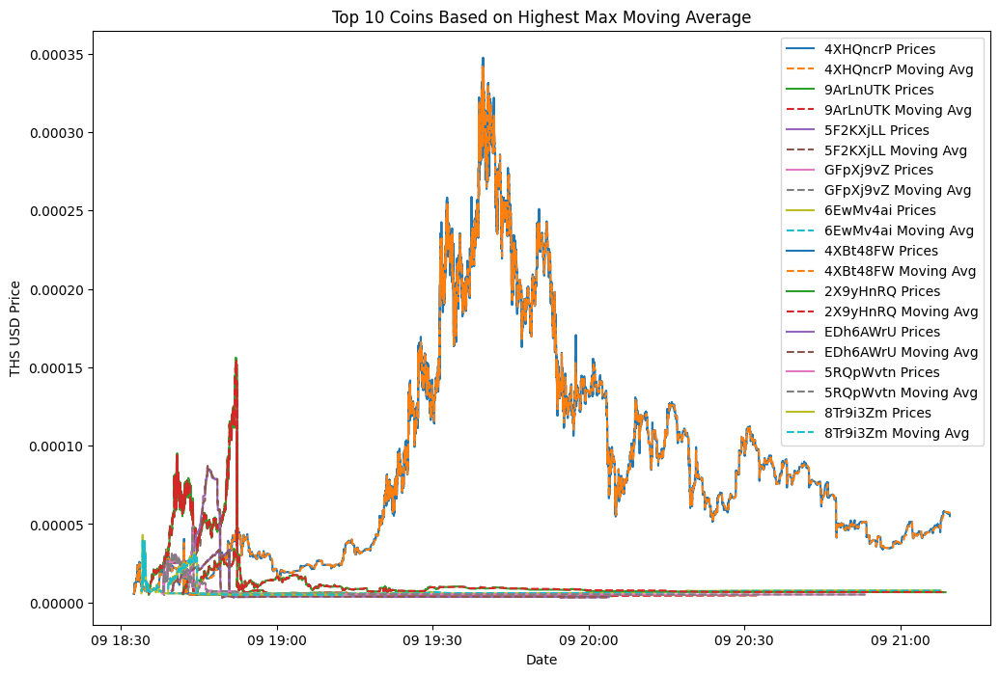

In [8]:
# Dictionary to store the max moving average for each coin
coin_max_moving_avg = {}
# Iterate through each group (each unique coin)
for mint, group in df.groupby('Mint'):
    group = group.sort_values('Date').reset_index(drop=True)
    
    # Ensure there are enough data points
    if len(group) >= 10:
        # Calculate the moving average
        group['Moving Avg'] = group['THS USD Price'].rolling(window=5).mean()
        
        # Calculate and store the max moving average
        max_moving_avg = group['Moving Avg'].max()
        coin_max_moving_avg[mint] = max_moving_avg

# Sort coins by max moving average and select the top 10
top_10_coins = sorted(coin_max_moving_avg, key=coin_max_moving_avg.get, reverse=True)[:10]

# Plot setup
plt.figure(figsize=(12, 8))

for mint in top_10_coins:
    group = df[df['Mint'] == mint].sort_values('Date').reset_index(drop=True)
    group['Moving Avg'] = group['THS USD Price'].rolling(window=5).mean()
    
    # Plotting the prices and moving averages
    plt.plot(group['Date'], group['THS USD Price'], label=f'{mint[:8]} Prices')
    plt.plot(group['Date'], group['Moving Avg'], label=f'{mint[:8]} Moving Avg', linestyle='--')

# Customize and show the plot
plt.legend()
plt.title('Top 10 Coins Based on Highest Max Moving Average')
plt.xlabel('Date')
plt.ylabel('THS USD Price')
plt.show()

/var/folders/gl/5qbww88d3j9565v3nmq3h8nc0000gn/T/ipykernel_73388/309064403.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_group['Moving Avg'] = filtered_group['THS USD Price'].rolling(window=10).mean()
/var/folders/gl/5qbww88d3j9565v3nmq3h8nc0000gn/T/ipykernel_73388/309064403.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_group['Moving Avg'] = filtered_group['THS USD Price'].rolling(window=10).mean()
/var/folders/gl/5qbww88d3j9565v3nmq3h8nc0000gn/T/ipykernel_73388/309064403.py:

['6EwMv4aiLV4cVmsjRY8YeHybk6tLSmX1drheKHZqpump', '2X9yHnRQcYUauPGtnnFEwt7XDyfN8KZqJ9oRnD8Mpump', '2KPZ3HPNR1p4Wa9tz65gJfEXH1UvqL8vVLKWZGB4pump', '6KHBFWg3VKVdh4byaFrrdKXSerNa5RCUAoRei6wYpump', '2qxDKzYw341Hp2CCi4Z4VrFcGV17TXVB9oZmABQbpump', '386Rf9dv2gbtEABRSXQddggsydomjEsj2gSVoV9KSW5S', '3AaxmkXvFBDYLgSK8nsQyLvJ718vqwm2ypdpkTRdpump', '3Dt6ZYN1j56SDw2eMGxtV4bYAgL9CF4ztL4KmZ4Npump', '2hETRpmLjv3dhW8wWgHi7TJ6dNmivaFnLmoNQ1zcpump', '3cyALT63sV4yyC1AdBgxGCu1aMEc4RS9aDu8DNDZpump', '3fkNWAm6EbsJTVk6Q89cP8DYiQLF7Ygzzj9R9dadpump', '42TMMkSmn2Me9CxKtsnQrcAyDYqa14FTy64xrKyTmB86', '3uiFQKNDgn5DjgWpJdPUP5Rq8kQwjmrjRm6YC5YJA4YA', '3XYUfWtSsqpBT5Lwiy8Ta3UzURMtTudArBAeekvYXLbC', '3HvxjfhCrAs5t3B5fggRh5J4LjQxurgFQXrcLJZcAwmA', '2uW23jRAmrBs2Awzmh6pmKrjQCQ3j8xtdV5whuHxpump', '3X17kGaAxBs1xSPmc43oN6Rof3dTC6CwBVSK2RMBpump', '2mLns7xoaxV9e6QkWrLhmYVLNPZ3GdKCVva6Wpcapump', '2i3Aqg518ibMogJUjTRuEmgkTfdx4MhTaMXVWkrppump', '3FqAi9dT1TBB7mMxFTART6R3FmjLhAVkS1zLaLSQpump']


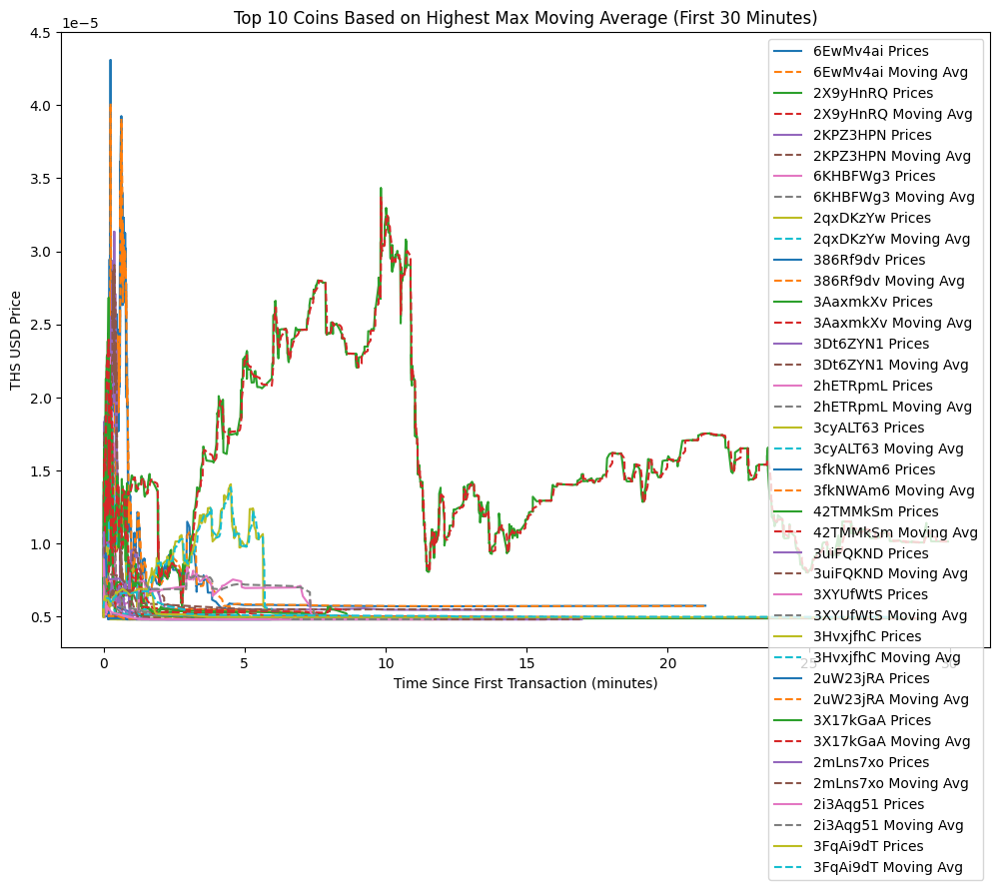

In [ ]:
# Dictionary to store the max moving average for each coin
coin_max_moving_avg = {}

# Iterate through each group (each unique coin)
for mint, group in df.groupby('Mint'):
    group = group.sort_values('Date').reset_index(drop=True)
    
    # Create a time index relative to the first transaction
    group['Time Since First'] = (group['Date'] - group['Date'].min()).dt.total_seconds()

    # Filter for the first 30 minutes (600 seconds)
    filtered_group = group[group['Time Since First'] <= 2400]

    # Ensure there are enough data points
    if len(filtered_group) >= 5:
        # Calculate the moving average
        filtered_group['Moving Avg'] = filtered_group['THS USD Price'].rolling(window=10).mean()
        
        # Calculate and store the max moving average
        max_moving_avg = filtered_group['Moving Avg'].max()
        coin_max_moving_avg[mint] = max_moving_avg

# Sort coins by max moving average and select the top 10
top_10_coins = sorted(coin_max_moving_avg, key=coin_max_moving_avg.get, reverse=True)[:20]
print(top_10_coins)

# Plot setup
plt.figure(figsize=(12, 8))

for mint in top_10_coins:
    group = df[df['Mint'] == mint].sort_values('Date').reset_index(drop=True)
    group['Time Since First'] = (group['Date'] - group['Date'].min()).dt.total_seconds()
    filtered_group = group[group['Time Since First'] <= 2400]
    filtered_group['Moving Avg'] = filtered_group['THS USD Price'].rolling(window=5).mean()

    # Plotting the prices and moving averages
    plt.plot(filtered_group['Time Since First'] / 60, filtered_group['THS USD Price'], label=f'{mint[:8]} Prices')
    plt.plot(filtered_group['Time Since First'] / 60, filtered_group['Moving Avg'], label=f'{mint[:8]} Moving Avg', linestyle='--')

# Customize and show the plot
plt.legend()
plt.title('Top 10 Coins Based on Highest Max Moving Average (First 30 Minutes)')
plt.xlabel('Time Since First Transaction (minutes)')
plt.ylabel('THS USD Price')
plt.show()

Top Coins Statistics:
          THS Amount  THS USD Price  THS USD Amount   SOL Amount  \
count  4.103000e+03    4103.000000    4.103000e+03  4103.000000   
mean   7.487974e+06       0.000014    9.014816e+01     0.527997   
std    1.190537e+07       0.000007    1.481013e+02     0.893417   
min    1.092700e-02       0.000005    8.371175e-08     0.000000   
25%    2.855221e+05       0.000008    2.587041e+00     0.015000   
50%    1.962620e+06       0.000011    2.329993e+01     0.135748   
75%    1.065972e+07       0.000017    1.180028e+02     0.686139   
max    2.664629e+08       0.000043    2.238699e+03    17.195783   

       SOL USD Price  SOL USD Amount  Price Change  Volume Change  IsTop10  \
count    4103.000000     4103.000000   4103.000000   4.103000e+03   4103.0   
mean      171.978461       90.812116     -0.001408   5.518873e+04      1.0   
std         0.270672      153.671712      0.038975   3.515885e+06      0.0   
min       170.762444        0.000000     -0.466898  -1.000000

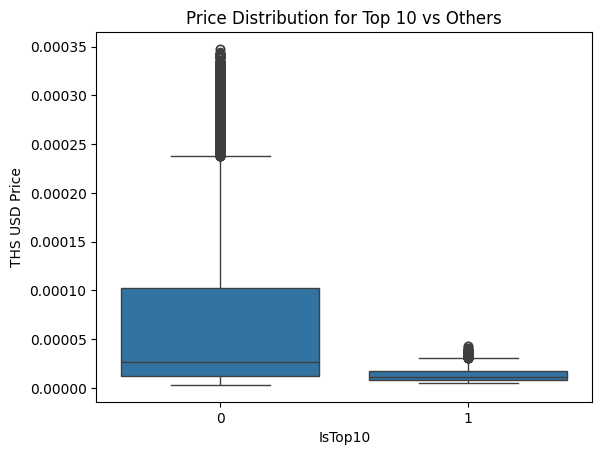

In [16]:
import pandas as pd
from scipy.stats import ttest_ind
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate additional features
df['Price Change'] = df.groupby('Mint')['THS USD Price'].pct_change()
df['Volume Change'] = df.groupby('Mint')['THS Amount'].pct_change()
df.dropna(inplace=True)

# List of top 10 coins
top_10_mints = set(top_10_coins)

# Add a label for top coins
df['IsTop10'] = df['Mint'].apply(lambda x: 1 if x in top_10_mints else 0)

# Descriptive statistics
top_coins = df[df['IsTop10'] == 1]
other_coins = df[df['IsTop10'] == 0]
print("Top Coins Statistics:\n", top_coins.describe())
print("\nOther Coins Statistics:\n", other_coins.describe())

# Statistical test
t_stat, p_val = ttest_ind(top_coins['THS USD Price'], other_coins['THS USD Price'])
print(f"T-Test between Top 10 and Others - T-stat: {t_stat}, P-value: {p_val}")

# Feature importance using RandomForest
features = ['Price Change', 'Volume Change', 'THS USD Price', 'THS Amount']
X = df[features]
y = df['IsTop10']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# Feature importance
importance = model.feature_importances_
feature_importance = pd.DataFrame({'Feature': features, 'Importance': importance})
print("\nFeature Importances:\n", feature_importance)

# Confusion Matrix
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Visualize distributions
sns.boxplot(x='IsTop10', y='THS USD Price', data=df)
plt.title('Price Distribution for Top 10 vs Others')
plt.show()

Top Coins Statistics:
          THS Amount  THS USD Price  THS USD Amount   SOL Amount  \
count  4.323000e+03    4323.000000    4.323000e+03  4323.000000   
mean   7.870101e+06       0.000014    9.393942e+01     0.549787   
std    1.242147e+07       0.000007    1.528566e+02     0.920921   
min    1.092700e-02       0.000005    8.371175e-08     0.000000   
25%    2.924988e+05       0.000008    2.588230e+00     0.015017   
50%    2.266878e+06       0.000011    2.591763e+01     0.150000   
75%    1.133975e+07       0.000017    1.242522e+02     0.730432   
max    2.664629e+08       0.000043    2.238699e+03    17.195783   

       SOL USD Price  SOL USD Amount  Price Change  Volume Change  IsTop10  \
count    4323.000000     4323.000000   4323.000000   4.323000e+03   4323.0   
mean      171.978574       94.558551     -0.000936   5.239127e+04      1.0   
std         0.264550      158.396755      0.040723   3.425255e+06      0.0   
min       170.762444        0.000000     -0.466898  -1.000000

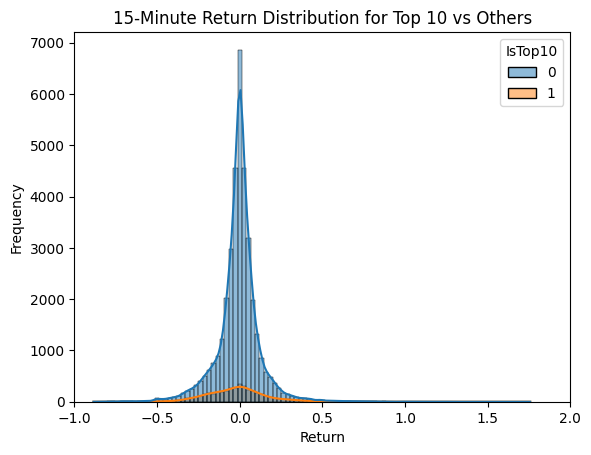

In [13]:
import pandas as pd
from scipy.stats import ttest_ind
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate additional features
df['Price Change'] = df.groupby('Mint')['THS USD Price'].pct_change()
df['Volume Change'] = df.groupby('Mint')['THS Amount'].pct_change()
df.dropna(inplace=True)

# List of top 10 coins
top_10_mints = set(top_10_coins)

# Add a label for top coins
df['IsTop10'] = df['Mint'].apply(lambda x: 1 if x in top_10_mints else 0)

# Descriptive statistics
top_coins = df[df['IsTop10'] == 1]
other_coins = df[df['IsTop10'] == 0]
print("Top Coins Statistics:\n", top_coins.describe())
print("\nOther Coins Statistics:\n", other_coins.describe())

# Statistical test
t_stat, p_val = ttest_ind(top_coins['THS USD Price'], other_coins['THS USD Price'])
print(f"T-Test between Top 10 and Others - T-stat: {t_stat}, P-value: {p_val}")

# Feature importance using RandomForest
features = ['Price Change', 'Volume Change', 'THS USD Price', 'THS Amount']
X = df[features]
y = df['IsTop10']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# Feature importance
importance = model.feature_importances_
feature_importance = pd.DataFrame({'Feature': features, 'Importance': importance})
print("\nFeature Importances:\n", feature_importance)

# Confusion Matrix
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Calculate 15-minute returns for each coin
df['Return'] = df.groupby('Mint')['THS USD Price'].pct_change(periods=15)
df.dropna(subset=['Return'], inplace=True)

# Visualize 15-minute return distribution
sns.histplot(data=df, x='Return', hue='IsTop10', bins=100, kde=True)
plt.title('15-Minute Return Distribution for Top 10 vs Others')
plt.xlim(-1, 2)  # Adjust based on observed data range
plt.xlabel('Return')
plt.ylabel('Frequency')
plt.show()

In [14]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Extract the first 10 trades per coin
df_sorted = df.sort_values(by=['Mint', 'Date'])
first_10_trades = df_sorted.groupby('Mint').head(10)
print(df_sorted)


# # Calculate features: mean price, mean volume, price change, volume change
# features = first_10_trades.groupby('Mint').agg({
#     'THS USD Price': ['mean', 'std'],
#     'THS Amount': ['mean', 'std'],
#     'Price Change': 'mean',
#     'Volume Change': 'mean'
# }).reset_index()

# # Flatten multi-level columns
# features.columns = ['Mint', 'Price_Mean', 'Price_Std', 'Amount_Mean', 'Amount_Std', 'Price_Change_Mean', 'Volume_Change_Mean']

# # Merge with target label
# features = features.merge(df[['Mint', 'IsTop10']].drop_duplicates(), on='Mint')

# # Prepare data for modeling
# X = features.drop(columns=['Mint', 'IsTop10'])
# y = features['IsTop10']

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Train a RandomForest model
# model = RandomForestClassifier(n_estimators=100, random_state=42)
# model.fit(X_train, y_train)
# y_pred = model.predict(X_test)

# # Evaluate model performance
# print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))
# print("\nClassification Report:\n", classification_report(y_test, y_pred))

# # Analyze feature importance
# importance = model.feature_importances_
# feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': importance})
# print("\nFeature Importances:\n", feature_importance)

# from sklearn.model_selection import cross_val_score

# # Cross-validation
# cross_val_scores = cross_val_score(model, X, y, cv=5)
# print("Cross-validation scores:", cross_val_scores)
# print("Mean cross-validation score:", np.mean(cross_val_scores))

# # Visualizing feature importance
# feature_importance.plot(kind='barh', x='Feature', y='Importance', legend=False)
# plt.title('Feature Importance')
# plt.show()

                                               Mint                      Date  \
41758  24iBmaYS1guEAXL2RXJHr9xQnAYyxnjCTMFhMVPtpump 2025-05-09 18:41:02+00:00   
41759  24iBmaYS1guEAXL2RXJHr9xQnAYyxnjCTMFhMVPtpump 2025-05-09 18:41:03+00:00   
41760  24iBmaYS1guEAXL2RXJHr9xQnAYyxnjCTMFhMVPtpump 2025-05-09 18:41:03+00:00   
41761  24iBmaYS1guEAXL2RXJHr9xQnAYyxnjCTMFhMVPtpump 2025-05-09 18:41:03+00:00   
41762  24iBmaYS1guEAXL2RXJHr9xQnAYyxnjCTMFhMVPtpump 2025-05-09 18:41:03+00:00   
...                                             ...                       ...   
33568   uvYzX4fYAnubR4YrnSZBbPa287BwV3nXVkwRJajpump 2025-05-09 18:38:42+00:00   
33569   uvYzX4fYAnubR4YrnSZBbPa287BwV3nXVkwRJajpump 2025-05-09 18:38:44+00:00   
33570   uvYzX4fYAnubR4YrnSZBbPa287BwV3nXVkwRJajpump 2025-05-09 18:42:24+00:00   
33571   uvYzX4fYAnubR4YrnSZBbPa287BwV3nXVkwRJajpump 2025-05-09 19:09:24+00:00   
33572   uvYzX4fYAnubR4YrnSZBbPa287BwV3nXVkwRJajpump 2025-05-09 19:09:59+00:00   

       Type    THS Amount  

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler

# Feature Engineering
df['Price Change'] = df.groupby('Mint')['THS USD Price'].pct_change()
df['Volume Change'] = df.groupby('Mint')['THS Amount'].pct_change()
df.dropna(inplace=True)

# Define binary labels for top 10 coins (assuming `top_10_coins` is predefined)
top_10_mints = set(top_10_coins)
df['IsTop10'] = df['Mint'].apply(lambda x: 1 if x in top_10_mints else 0)

# Extract features and labels
features = ['Price Change', 'Volume Change', 'THS USD Price', 'THS Amount']
X = df[features]
y = df['IsTop10']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train Random Forest model
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train_scaled, y_train)

# Evaluate model
y_pred = model.predict(X_test_scaled)
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Check feature importance
feature_importance = pd.DataFrame({'Feature': features, 'Importance': model.feature_importances_})

print("\nFeature Importances:\n", feature_importance)


Confusion Matrix:
 [[8950  181]
 [ 697  230]]

Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.98      0.95      9131
           1       0.56      0.25      0.34       927

    accuracy                           0.91     10058
   macro avg       0.74      0.61      0.65     10058
weighted avg       0.89      0.91      0.90     10058


Feature Importances:
          Feature  Importance
0   Price Change    0.273040
1  Volume Change    0.012918
2  THS USD Price    0.386135
3     THS Amount    0.327907


In [22]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Step 1: Load and preprocess the data
df = pd.read_csv('/Users/sterling/Documents/simpleDmca/PumpFun/pump-fun-bot/data/transactions500Newer.csv')
df['Date'] = pd.to_datetime(df['Date'])

# Sort by date within each mint
df_sorted = df.sort_values(by=['Mint', 'Date'])

# Identify max price in first 10 vs. remaining
max_10 = df_sorted.groupby('Mint').apply(lambda x: x.head(10)['THS USD Price'].max())
max_rest = df_sorted.groupby('Mint').apply(lambda x: x.iloc[10:]['THS USD Price'].max())
targets = max_10 > max_rest

# Prepare the labels
df_label = pd.DataFrame({'Mint': max_10.index, 'Label': targets.astype(int)})

# Prepare features from first 10 transactions
first_10_trades = df_sorted.groupby('Mint').head(10)

# Aggregate features for first 10 transactions
features = first_10_trades.groupby('Mint').agg({
    'THS USD Price': ['mean', 'std', 'max'],
    'THS Amount': ['mean', 'std']
}).reset_index()

features.columns = ['Mint', 'Price_Mean', 'Price_Std', 'Price_Max', 'Amount_Mean', 'Amount_Std']
# Ensure 'Mint' is a column, not an index
df_label = df_label.reset_index()
features = features.merge(df_label, on='Mint')

# Extract feature matrix (X) and labels (y)
X = features.drop(columns=['Mint', 'Label'])
y = features['Label']

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Step 3: Train the Random Forest model
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_scaled, y)

# Step 4: Load and preprocess test data
test_df = pd.read_csv('/Users/sterling/Documents/simpleDmca/PumpFun/pump-fun-bot/data/transactions100.csv')
test_df['Date'] = pd.to_datetime(test_df['Date'])

# Sort by date within each mint
test_sorted = test_df.sort_values(by=['Mint', 'Date'])

# Process first 10 transactions
test_first_10 = test_sorted.groupby('Mint').head(10)

# Aggregate features for the test data
test_features = test_first_10.groupby('Mint').agg({
    'THS USD Price': ['mean', 'std', 'max'],
    'THS Amount': ['mean', 'std']
}).reset_index()

test_features.columns = ['Mint', 'Price_Mean', 'Price_Std', 'Price_Max', 'Amount_Mean', 'Amount_Std']
X_test = test_features.drop(columns=['Mint'])
X_test_scaled = scaler.transform(X_test)

# Step 5: Predict and export results
predictions = model.predict(X_test_scaled)
probabilities = model.predict_proba(X_test_scaled)[:, 1]

results = pd.DataFrame({
    'Mint': test_features['Mint'],
    'Prediction': predictions,
    'Probability': probabilities
})

# Assume real values are available for evaluation
real_max_10 = test_sorted.groupby('Mint').apply(lambda x: x.head(10)['THS USD Price'].max())
real_max_rest = test_sorted.groupby('Mint').apply(lambda x: x.iloc[10:]['THS USD Price'].max())
real_labels = (real_max_10 > real_max_rest).astype(int)

# Combine results and evaluate
results = results.merge(pd.DataFrame({'Mint': real_max_10.index, 'Actual': real_labels}), on='Mint')
results['Correct'] = results['Prediction'] == results['Actual']

# Export CSV
results.to_csv('predictions_output.csv', index=False)

# Step 6: Print summary statistics
accuracy = results['Correct'].mean()
print(f"Model Accuracy: {accuracy:.2f}")
print("\nConfusion Matrix:\n", confusion_matrix(results['Actual'], results['Prediction']))
print("\nClassification Report:\n", classification_report(results['Actual'], results['Prediction']))

/var/folders/gl/5qbww88d3j9565v3nmq3h8nc0000gn/T/ipykernel_73388/1769521553.py:15: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  max_10 = df_sorted.groupby('Mint').apply(lambda x: x.head(10)['THS USD Price'].max())
/var/folders/gl/5qbww88d3j9565v3nmq3h8nc0000gn/T/ipykernel_73388/1769521553.py:16: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  max_rest = df_sorted.groupby('Mint').apply(lambda x: x.iloc[10:]['

ValueError: cannot insert Mint, already exists

In [25]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

# Load and preprocess the primary dataset
df = pd.read_csv('/Users/sterling/Documents/simpleDmca/PumpFun/pump-fun-bot/data/transactions500Newer.csv')
df['Date'] = pd.to_datetime(df['Date'])

# Sort within each mint
df_sorted = df.sort_values(by=['Mint', 'Date'])

# Calculate max price for first 10 transactions vs. the rest
max_10 = df_sorted.groupby('Mint').apply(lambda x: x.head(10)['THS USD Price'].max())
max_rest = df_sorted.groupby('Mint').apply(lambda x: x.iloc[10:]['THS USD Price'].max())
targets = max_10 > max_rest

# Prepare the labels
df_label = pd.DataFrame({'Mint': max_10.index, 'Label': targets.astype(int)}).reset_index(drop=True)

# Prepare features from first 10 transactions
first_10_trades = df_sorted.groupby('Mint').head(10)

# Aggregate features for first 10 transactions
features = first_10_trades.groupby('Mint').agg({
    'THS USD Price': ['mean', 'std', 'max'],
    'THS Amount': ['mean', 'std']
}).reset_index()

features.columns = ['Mint', 'Price_Mean', 'Price_Std', 'Price_Max', 'Amount_Mean', 'Amount_Std']

# Merge features with the labels
features = features.merge(df_label, on='Mint')

# Extract feature matrix (X) and labels (y)
X = features.drop(columns=['Mint', 'Label'])
y = features['Label']

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train the Random Forest model
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_scaled, y)

# Load and preprocess the test dataset
test_df = pd.read_csv('/Users/sterling/Documents/simpleDmca/PumpFun/pump-fun-bot/data/transactions100.csv')
test_df['Date'] = pd.to_datetime(test_df['Date'])

# Sort within each mint
test_sorted = test_df.sort_values(by=['Mint', 'Date'])

# Process first 10 transactions
test_first_10 = test_sorted.groupby('Mint').head(10)

# Aggregate features for the test data
test_features = test_first_10.groupby('Mint').agg({
    'THS USD Price': ['mean', 'std', 'max'],
    'THS Amount': ['mean', 'std']
}).reset_index()

test_features.columns = ['Mint', 'Price_Mean', 'Price_Std', 'Price_Max', 'Amount_Mean', 'Amount_Std']
X_test = test_features.drop(columns=['Mint'])
X_test_scaled = scaler.transform(X_test)

# Predict and export results
predictions = model.predict(X_test_scaled)
probabilities = model.predict_proba(X_test_scaled)[:, 1]

# Combine predictions with probabilities
results = pd.DataFrame({
    'Mint': test_features['Mint'],
    'Prediction': predictions,
    'Probability': probabilities
})

# Calculate actual labels for evaluation
real_max_10 = test_sorted.groupby('Mint').apply(lambda x: x.head(10)['THS USD Price'].max())
real_max_rest = test_sorted.groupby('Mint').apply(lambda x: x.iloc[10:]['THS USD Price'].max())
real_labels = (real_max_10 > real_max_rest).astype(int).reset_index(drop=True)

# Combine results and evaluate correctness
results = results.merge(pd.DataFrame({'Mint': real_max_10.index, 'Actual': real_labels}), on='Mint')
results['Correct'] = results['Prediction'] == results['Actual']

# Export CSVf
results.to_csv('predictions_output.csv', index=False)

# Print summary statistics
accuracy = results['Correct'].mean()
print(f"Model Accuracy: {accuracy:.2f}")
print("\nConfusion Matrix:\n", confusion_matrix(results['Actual'], results['Prediction']))
print("\nClassification Report:\n", classification_report(results['Actual'], results['Prediction']))

Model Accuracy: 0.68

Confusion Matrix:
 [[25 19]
 [13 42]]

Classification Report:
               precision    recall  f1-score   support

           0       0.66      0.57      0.61        44
           1       0.69      0.76      0.72        55

    accuracy                           0.68        99
   macro avg       0.67      0.67      0.67        99
weighted avg       0.67      0.68      0.67        99



/var/folders/gl/5qbww88d3j9565v3nmq3h8nc0000gn/T/ipykernel_73388/2327555104.py:14: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  max_10 = df_sorted.groupby('Mint').apply(lambda x: x.head(10)['THS USD Price'].max())
/var/folders/gl/5qbww88d3j9565v3nmq3h8nc0000gn/T/ipykernel_73388/2327555104.py:15: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  max_rest = df_sorted.groupby('Mint').apply(lambda x: x.iloc[10:]['

In [59]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE

# Load and preprocess the primary dataset
df = pd.read_csv('/Users/sterling/Documents/simpleDmca/PumpFun/pump-fun-bot/data/transactions500.csv')
df['Date'] = pd.to_datetime(df['Date'])

# Sort within each mint
df_sorted = df.sort_values(by=['Mint', 'Date'])

# Calculate time deltas from the first trade
df_sorted['TimeDelta'] = df_sorted.groupby('Mint')['Date'].transform(lambda x: (x - x.min()).dt.total_seconds())

# Function to calculate features for each interval
def calculate_features(df, duration):
    interval_data = df[df['TimeDelta'] <= duration]
    buy_data = interval_data[interval_data['Transaction Type'] == 'buy']
    
    # Calculate buy volume
    buy_volume = buy_data.groupby('Mint')['THS Amount'].sum()
    # Calculate price volatility
    price_volatility = interval_data.groupby('Mint')['THS USD Price'].std()
    
    return buy_volume, price_volatility

# Calculate features for 1, 2, 3, and 4 minute intervals
interval_durations = [60, 120, 180, 240]
features_dict = {}

for duration in interval_durations:
    buy_volume, price_volatility = calculate_features(df_sorted, duration)
    features_dict[f'Buy_Volume_{duration//60}min'] = buy_volume
    features_dict[f'Volatility_{duration//60}min'] = price_volatility

# Calculate the target: mean price in the next 10 minutes > price_max in the first 4 minutes
next_10_intervals = df_sorted[(df_sorted['TimeDelta'] > 240) & (df_sorted['TimeDelta'] <= 840)]
mean_next_10_price = next_10_intervals.groupby('Mint')['THS USD Price'].mean()
first_4min_max = df_sorted[df_sorted['TimeDelta'] <= 240].groupby('Mint')['THS USD Price'].max()
targets = mean_next_10_price > first_4min_max
targets.fillna(False, inplace=True)

# Prepare features DataFrame
features = pd.DataFrame(features_dict).dropna()
features['Label'] = features.index.map(targets).astype(int)

# Extract feature matrix (X) and labels (y)
X = features.drop(columns=['Label']).reset_index(drop=True)
y = features['Label'].reset_index(drop=True)

# Handle missing values by imputation
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Handle class imbalance using SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_scaled, y)

# Train the Random Forest model with balanced data
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_resampled, y_resampled)

# Load and preprocess the test dataset
test_df = pd.read_csv('/Users/sterling/Documents/simpleDmca/PumpFun/pump-fun-bot/data/transactions100.csv')
test_df['Date'] = pd.to_datetime(test_df['Date'])

# Sort within each mint
test_sorted = test_df.sort_values(by=['Mint', 'Date'])

# Calculate time deltas from the first trade
test_sorted['TimeDelta'] = test_sorted.groupby('Mint')['Date'].transform(lambda x: (x - x.min()).dt.total_seconds())

# Function to calculate test features
def calculate_test_features(df, duration):
    interval_data = df[df['TimeDelta'] <= duration]
    buy_data = interval_data[interval_data['Transaction Type'] == 'buy']
    
    # Calculate buy volume
    buy_volume = buy_data.groupby('Mint')['THS Amount'].sum()
    # Calculate price volatility
    price_volatility = interval_data.groupby('Mint')['THS USD Price'].std()
    
    return buy_volume, price_volatility

# Calculate test features
test_features_dict = {}
for duration in interval_durations:
    buy_volume, price_volatility = calculate_test_features(test_sorted, duration)
    test_features_dict[f'Buy_Volume_{duration//60}min'] = buy_volume
    test_features_dict[f'Volatility_{duration//60}min'] = price_volatility

# Prepare test features DataFrame
test_features = pd.DataFrame(test_features_dict).dropna().reset_index()
X_test = test_features.drop(columns=['Mint'])

# Impute and scale test features
X_test_imputed = imputer.transform(X_test)
X_test_scaled = scaler.transform(X_test_imputed)

# Predict with a custom threshold
probabilities = model.predict_proba(X_test_scaled)[:, 1]
threshold = 0.5  # Adjust threshold based on your needs
predictions = (probabilities > threshold).astype(int)

# Combine predictions with probabilities
results = pd.DataFrame({
    'Mint': test_features['Mint'],
    'Prediction': predictions,
    'Probability': probabilities
})

# Calculate actual labels for evaluation
real_labels = test_sorted[test_sorted['TimeDelta'] <= 180].groupby('Mint')['THS USD Price'].max() > \
               test_sorted[test_sorted['TimeDelta'] > 840].groupby('Mint')['THS USD Price'].mean()

real_labels.fillna(False, inplace=True)
results['Actual'] = results['Mint'].map(real_labels).astype(int)
results['Correct'] = results['Prediction'] == results['Actual']

# Export CSV
results.to_csv('/Users/sterling/Documents/simpleDmca/PumpFun/pump-fun-bot/data/predictions_output.csv', index=False)

# Print summary statistics
accuracy = results['Correct'].mean()
print(f"Model Accuracy: {accuracy:.2f}")
print("\nConfusion Matrix:\n", confusion_matrix(results['Actual'], results['Prediction']))
print("\nClassification Report:\n", classification_report(results['Actual'], results['Prediction']))

KeyError: 'Transaction Type'

In [63]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE

# Load and preprocess the primary dataset
df = pd.read_csv('/Users/sterling/Documents/simpleDmca/PumpFun/pump-fun-bot/data/transactions500.csv')
df['Date'] = pd.to_datetime(df['Date'])

# Sort within each mint
df_sorted = df.sort_values(by=['Mint', 'Date'])

# Calculate time deltas from the first trade
df_sorted['TimeDelta'] = df_sorted.groupby('Mint')['Date'].transform(lambda x: (x - x.min()).dt.total_seconds())

# Identify the max price for the first 3 minutes and the rest
first_3min_max = df_sorted[df_sorted['TimeDelta'] <= 180].groupby('Mint')['THS USD Price'].max()
rest_max = df_sorted[df_sorted['TimeDelta'] > 180].groupby('Mint')['THS USD Price'].max()

# Align indices and fill missing values
first_3min_max, rest_max = first_3min_max.align(rest_max, fill_value=-1)

# Calculate the target
targets = first_3min_max > rest_max

# Prepare the labels
df_label = pd.DataFrame({'Mint': first_3min_max.index, 'Label': targets.astype(int)}).reset_index(drop=True)

# Prepare features from the first 3 minutes
first_3min_data = df_sorted[df_sorted['TimeDelta'] <= 180]

# Aggregate features for the first 3 minutes
features = first_3min_data.groupby('Mint').agg({
    'THS USD Price': ['mean', 'std', 'max'],
    'THS Amount': ['mean', 'std']
}).reset_index()

features.columns = ['Mint', 'Price_Mean', 'Price_Std', 'Price_Max', 'Amount_Mean', 'Amount_Std']

# Merge features with the labels
features = features.merge(df_label, on='Mint')

# Extract feature matrix (X) and labels (y)
X = features.drop(columns=['Mint', 'Label'])
y = features['Label']

# Handle missing values by imputation
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Handle class imbalance using SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_scaled, y)

# Train the Random Forest model with balanced data
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_resampled, y_resampled)

# Load and preprocess the test dataset
test_df = pd.read_csv('/Users/sterling/Documents/simpleDmca/PumpFun/pump-fun-bot/data/transactions500V2.csv')
test_df['Date'] = pd.to_datetime(test_df['Date'])

# Sort within each mint
test_sorted = test_df.sort_values(by=['Mint', 'Date'])

# Calculate time deltas from the first trade
test_sorted['TimeDelta'] = test_sorted.groupby('Mint')['Date'].transform(lambda x: (x - x.min()).dt.total_seconds())

# Process first 3 minutes
test_first_3min = test_sorted[test_sorted['TimeDelta'] <= 180]

# Aggregate features for the test data
test_features = test_first_3min.groupby('Mint').agg({
    'THS USD Price': ['mean', 'std', 'max'],
    'THS Amount': ['mean', 'std']
}).reset_index()

test_features.columns = ['Mint', 'Price_Mean', 'Price_Std', 'Price_Max', 'Amount_Mean', 'Amount_Std']
X_test = test_features.drop(columns=['Mint'])

# Impute and scale test features
X_test_imputed = imputer.transform(X_test)
X_test_scaled = scaler.transform(X_test_imputed)

# Predict with a custom threshold
probabilities = model.predict_proba(X_test_scaled)[:, 1]
threshold = 0.5  # Can adjust based on probability distribution
predictions = (probabilities > threshold).astype(int)

# Combine predictions with probabilities
results = pd.DataFrame({
    'Mint': test_features['Mint'],
    'Prediction': predictions,
    'Probability': probabilities
})

# Calculate actual labels for evaluation
real_first_3min_max = test_sorted[test_sorted['TimeDelta'] <= 180].groupby('Mint')['THS USD Price'].max().reindex(results['Mint'], fill_value=-1)
real_rest_max = test_sorted[test_sorted['TimeDelta'] > 180].groupby('Mint')['THS USD Price'].max().reindex(results['Mint'], fill_value=-1)
real_labels = (real_first_3min_max > real_rest_max).astype(int).reset_index(drop=True)

# Combine results and evaluate correctness
results['Actual'] = real_labels
results['Correct'] = results['Prediction'] == results['Actual']

# Export CSV
results.to_csv('/Users/sterling/Documents/simpleDmca/PumpFun/pump-fun-bot/data/predictions_output.csv', index=False)

# Print summary statistics
accuracy = results['Correct'].mean()
print(f"Model Accuracy: {accuracy:.2f}")
print("\nConfusion Matrix:\n", confusion_matrix(results['Actual'], results['Prediction']))
print("\nClassification Report:\n", classification_report(results['Actual'], results['Prediction']))

Model Accuracy: 0.79

Confusion Matrix:
 [[ 21  15]
 [ 90 370]]

Classification Report:
               precision    recall  f1-score   support

           0       0.19      0.58      0.29        36
           1       0.96      0.80      0.88       460

    accuracy                           0.79       496
   macro avg       0.58      0.69      0.58       496
weighted avg       0.91      0.79      0.83       496



/var/folders/gl/5qbww88d3j9565v3nmq3h8nc0000gn/T/ipykernel_73388/3236557636.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  next_intervals['Interval'] = ((next_intervals['TimeDelta'] - 61) // 60).astype(int)
/var/folders/gl/5qbww88d3j9565v3nmq3h8nc0000gn/T/ipykernel_73388/3236557636.py:46: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


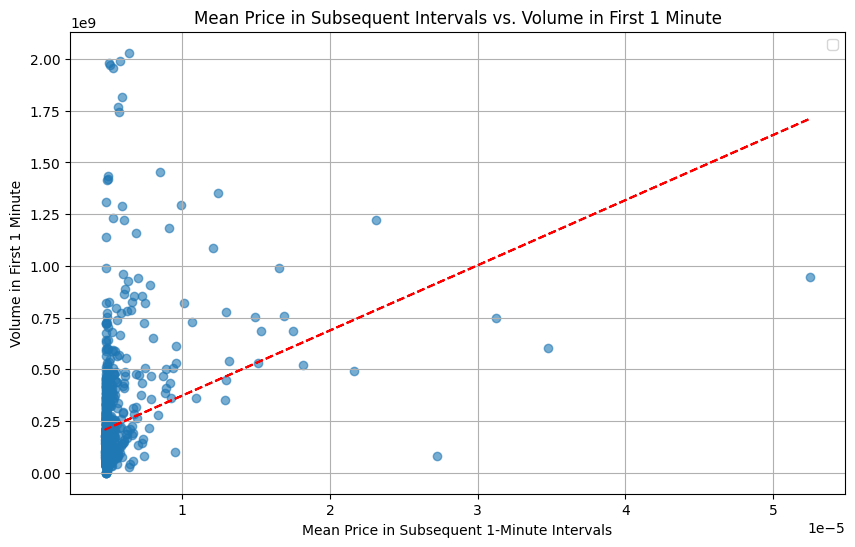

Correlation between volume in first 1 minute and mean price of next intervals: 0.30


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load and preprocess the dataset
df = pd.read_csv('/Users/sterling/Documents/simpleDmca/PumpFun/pump-fun-bot/data/transactions1000.csv')
df['Date'] = pd.to_datetime(df['Date'])

# Sort by Mint and Date
df_sorted = df.sort_values(by=['Mint', 'Date'])

# Calculate time deltas from the first trade
df_sorted['TimeDelta'] = df_sorted.groupby('Mint')['Date'].transform(lambda x: (x - x.min()).dt.total_seconds())

# Define intervals for the first 1 minute
# first_1min = df_sorted[df_sorted['TimeDelta'] <= 60]
first_1min = df_sorted[(df_sorted['TimeDelta'] <= 60) & (df_sorted['Type'] == 'buy')]


# Define intervals for each subsequent 1-minute period up to 960 seconds (16 minutes total)
next_intervals = df_sorted[(df_sorted['TimeDelta'] > 60) & (df_sorted['TimeDelta'] <= 960)]

# Adding a new column to indicate each 1-minute interval
next_intervals['Interval'] = ((next_intervals['TimeDelta'] - 61) // 60).astype(int)

# Calculate total transaction volume in the first 1 minute
vol_first_1min = first_1min.groupby('Mint')['THS Amount'].sum()

# Calculate mean price for each subsequent 1-minute interval
interval_prices = next_intervals.groupby(['Mint', 'Interval'])['THS USD Price'].mean()
mean_interval_price = interval_prices.groupby('Mint').mean()

# Merge data
analysis_df = pd.DataFrame({
    'Volume_First_1min': vol_first_1min,
    'Mean_Price_Next_Intervals': mean_interval_price
}).dropna()

# Plot
plt.figure(figsize=(10, 6))
plt.scatter(analysis_df['Mean_Price_Next_Intervals'], analysis_df['Volume_First_1min'], alpha=0.6)
plt.title('Mean Price in Subsequent Intervals vs. Buy Volume in First 1 Minute')
plt.xlabel('Mean Price in Subsequent 1-Minute Intervals')
plt.ylabel('Volume in First 1 Minute')
plt.grid(True)
plt.legend()

# Fit line
z = np.polyfit(analysis_df['Mean_Price_Next_Intervals'], analysis_df['Volume_First_1min'], 1)
p = np.poly1d(z)
plt.plot(analysis_df['Mean_Price_Next_Intervals'], p(analysis_df['Mean_Price_Next_Intervals']), "r--")

plt.show()

# Calculate correlation
correlation = analysis_df.corr().iloc[1, 0]
print(f"Correlation between volume in first 1 minute and mean price of next intervals: {correlation:.2f}")

/var/folders/gl/5qbww88d3j9565v3nmq3h8nc0000gn/T/ipykernel_73388/3974438923.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  next_intervals['Interval'] = ((next_intervals['TimeDelta'] - 241) // 240).astype(int)
/var/folders/gl/5qbww88d3j9565v3nmq3h8nc0000gn/T/ipykernel_73388/3974438923.py:47: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


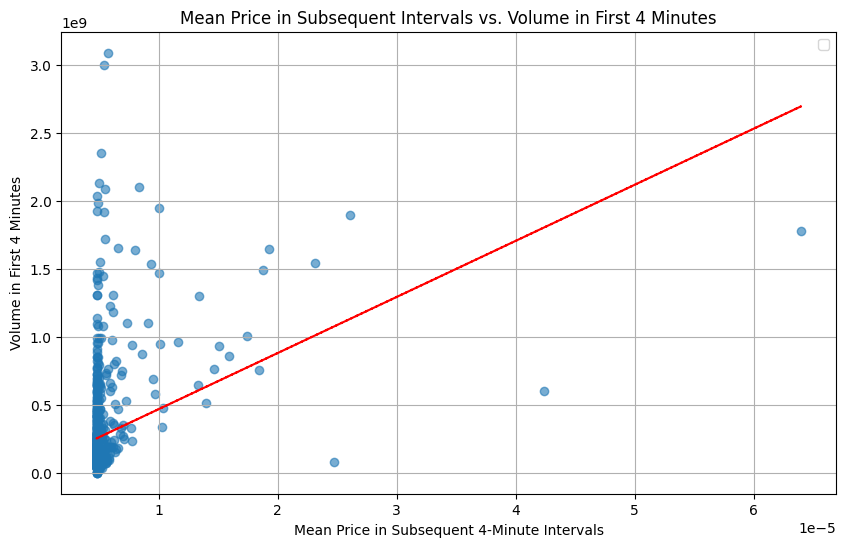

Correlation between volume in first 4 minutes and mean price of next intervals: 0.33


In [50]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load and preprocess the dataset
df = pd.read_csv('/Users/sterling/Documents/simpleDmca/PumpFun/pump-fun-bot/data/transactions1000.csv')
df['Date'] = pd.to_datetime(df['Date'])

# Sort by Mint and Date
df_sorted = df.sort_values(by=['Mint', 'Date'])

# Calculate time deltas from the first trade
df_sorted['TimeDelta'] = df_sorted.groupby('Mint')['Date'].transform(lambda x: (x - x.min()).dt.total_seconds())

# Define intervals for the first 4 minutes
# first_4min = df_sorted[df_sorted['TimeDelta'] <= 240]
first_4min = df_sorted[(df_sorted['TimeDelta'] <= 240) & (df_sorted['Type'] == 'buy')]



# Define intervals for each subsequent 4-minute period up to 960 seconds (16 minutes total)
next_intervals = df_sorted[(df_sorted['TimeDelta'] > 240) & (df_sorted['TimeDelta'] <= 960)]

# Adding a new column to indicate each 4-minute interval
next_intervals['Interval'] = ((next_intervals['TimeDelta'] - 241) // 240).astype(int)

# Calculate total transaction volume in the first 4 minutes
vol_first_4min = first_4min.groupby('Mint')['THS Amount'].sum()

# Calculate mean price for each subsequent 4-minute interval
interval_prices = next_intervals.groupby(['Mint', 'Interval'])['THS USD Price'].mean()
mean_interval_price = interval_prices.groupby('Mint').mean()

# Merge data
analysis_df = pd.DataFrame({
    'Volume_First_4min': vol_first_4min,
    'Mean_Price_Next_Intervals': mean_interval_price
}).dropna()

# Plot
plt.figure(figsize=(10, 6))
plt.scatter(analysis_df['Mean_Price_Next_Intervals'], analysis_df['Volume_First_4min'], alpha=0.6)
plt.title('Mean Price in Subsequent Intervals vs. Volume in First 4 Minutes')
plt.xlabel('Mean Price in Subsequent 4-Minute Intervals')
plt.ylabel('Volume in First 4 Minutes')
plt.grid(True)
plt.legend()

# Fit line
z = np.polyfit(analysis_df['Mean_Price_Next_Intervals'], analysis_df['Volume_First_4min'], 1)
p = np.poly1d(z)
plt.plot(analysis_df['Mean_Price_Next_Intervals'], p(analysis_df['Mean_Price_Next_Intervals']), "r--")

plt.show()

# Calculate correlation
correlation = analysis_df.corr().iloc[1, 0]
print(f"Correlation between volume in first 4 minutes and mean price of next intervals: {correlation:.2f}")

/var/folders/gl/5qbww88d3j9565v3nmq3h8nc0000gn/T/ipykernel_73388/253174356.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  next_intervals['Interval'] = ((next_intervals['TimeDelta'] - 241) // 240).astype(int)
/var/folders/gl/5qbww88d3j9565v3nmq3h8nc0000gn/T/ipykernel_73388/253174356.py:44: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


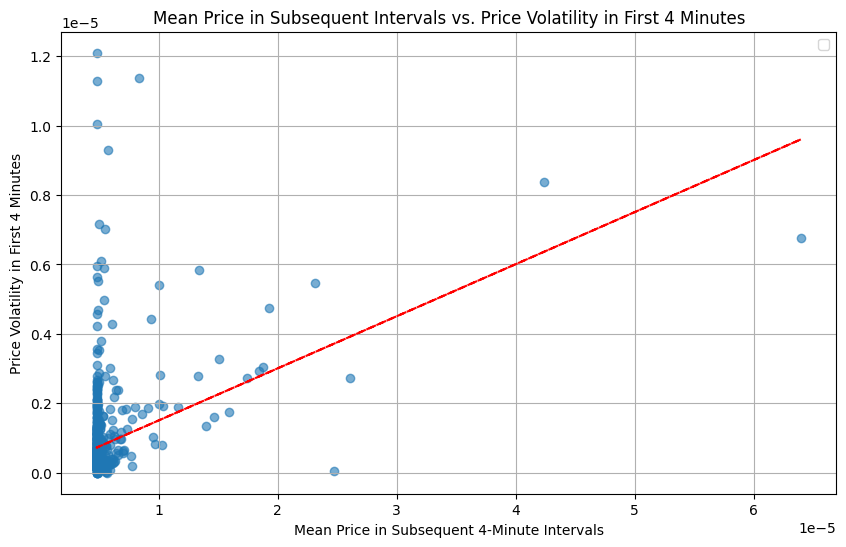

Correlation between price volatility in first 4 minutes and mean price of next intervals: 0.36


In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load and preprocess the dataset
df = pd.read_csv('/Users/sterling/Documents/simpleDmca/PumpFun/pump-fun-bot/data/transactions1000.csv')
df['Date'] = pd.to_datetime(df['Date'])

# Sort by Mint and Date
df_sorted = df.sort_values(by=['Mint', 'Date'])

# Calculate time deltas from the first trade
df_sorted['TimeDelta'] = df_sorted.groupby('Mint')['Date'].transform(lambda x: (x - x.min()).dt.total_seconds())

# Define intervals for the first 4 minutes
first_4min = df_sorted[df_sorted['TimeDelta'] <= 240]

# Define intervals for each subsequent 4-minute period up to 960 seconds (16 minutes total)
next_intervals = df_sorted[(df_sorted['TimeDelta'] > 240) & (df_sorted['TimeDelta'] <= 960)]

# Adding a new column to indicate each 4-minute interval
next_intervals['Interval'] = ((next_intervals['TimeDelta'] - 241) // 240).astype(int)

# Calculate price volatility (standard deviation) in the first 4 minutes
volatility_first_4min = first_4min.groupby('Mint')['THS USD Price'].std()

# Calculate mean price for each subsequent 4-minute interval
interval_prices = next_intervals.groupby(['Mint', 'Interval'])['THS USD Price'].mean()
mean_interval_price = interval_prices.groupby('Mint').mean()

# Merge data
analysis_df = pd.DataFrame({
    'Volatility_First_4min': volatility_first_4min,
    'Mean_Price_Next_Intervals': mean_interval_price
}).dropna()

# Plot
plt.figure(figsize=(10, 6))
plt.scatter(analysis_df['Mean_Price_Next_Intervals'], analysis_df['Volatility_First_4min'], alpha=0.6)
plt.title('Mean Price in Subsequent Intervals vs. Price Volatility in First 4 Minutes')
plt.xlabel('Mean Price in Subsequent 4-Minute Intervals')
plt.ylabel('Price Volatility in First 4 Minutes')
plt.grid(True)
plt.legend()

# Fit line
z = np.polyfit(analysis_df['Mean_Price_Next_Intervals'], analysis_df['Volatility_First_4min'], 1)
p = np.poly1d(z)
plt.plot(analysis_df['Mean_Price_Next_Intervals'], p(analysis_df['Mean_Price_Next_Intervals']), "r--")

plt.show()

# Calculate correlation
correlation = analysis_df.corr().iloc[1, 0]
print(f"Correlation between price volatility in first 4 minutes and mean price of next intervals: {correlation:.2f}")

/var/folders/gl/5qbww88d3j9565v3nmq3h8nc0000gn/T/ipykernel_73388/1123003709.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  next_intervals['Interval'] = ((next_intervals['TimeDelta'] - 61) // 60).astype(int)
/var/folders/gl/5qbww88d3j9565v3nmq3h8nc0000gn/T/ipykernel_73388/1123003709.py:44: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


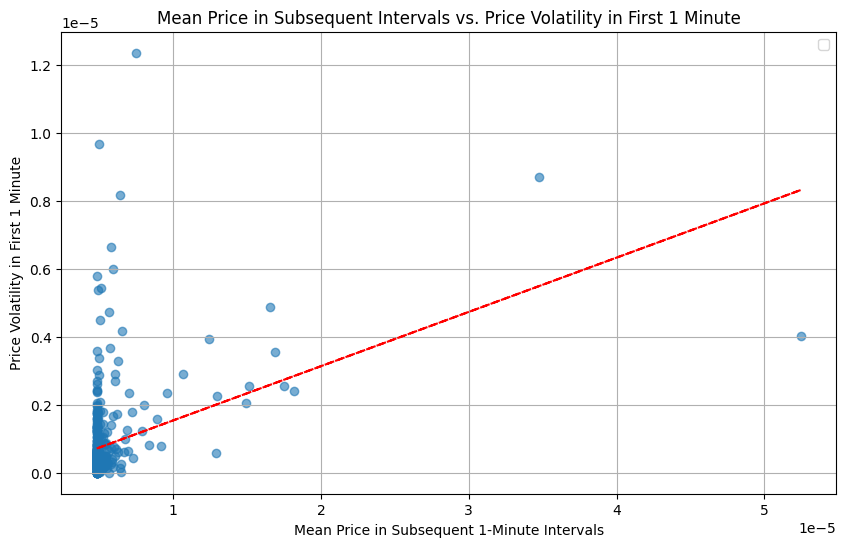

Correlation between price volatility in first 1 minute and mean price of next intervals: 0.38


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load and preprocess the dataset
df = pd.read_csv('/Users/sterling/Documents/simpleDmca/PumpFun/pump-fun-bot/data/transactions1000.csv')
df['Date'] = pd.to_datetime(df['Date'])

# Sort by Mint and Date
df_sorted = df.sort_values(by=['Mint', 'Date'])

# Calculate time deltas from the first trade
df_sorted['TimeDelta'] = df_sorted.groupby('Mint')['Date'].transform(lambda x: (x - x.min()).dt.total_seconds())

# Define intervals for the first 1 minute
first_1min = df_sorted[df_sorted['TimeDelta'] <= 60]

# Define intervals for each subsequent 1-minute period up to 960 seconds (16 minutes total)
next_intervals = df_sorted[(df_sorted['TimeDelta'] > 60) & (df_sorted['TimeDelta'] <= 960)]

# Adding a new column to indicate each 1-minute interval
next_intervals['Interval'] = ((next_intervals['TimeDelta'] - 61) // 60).astype(int)

# Calculate price volatility (standard deviation) in the first 1 minute
volatility_first_1min = first_1min.groupby('Mint')['THS USD Price'].std()

# Calculate mean price for each subsequent 1-minute interval
interval_prices = next_intervals.groupby(['Mint', 'Interval'])['THS USD Price'].mean()
mean_interval_price = interval_prices.groupby('Mint').mean()

# Merge data
analysis_df = pd.DataFrame({
    'Volatility_First_1min': volatility_first_1min,
    'Mean_Price_Next_Intervals': mean_interval_price
}).dropna()

# Plot
plt.figure(figsize=(10, 6))
plt.scatter(analysis_df['Mean_Price_Next_Intervals'], analysis_df['Volatility_First_1min'], alpha=0.6)
plt.title('Mean Price in Subsequent Intervals vs. Price Volatility in First 1 Minute')
plt.xlabel('Mean Price in Subsequent 1-Minute Intervals')
plt.ylabel('Price Volatility in First 1 Minute')
plt.grid(True)
plt.legend()

# Fit line
z = np.polyfit(analysis_df['Mean_Price_Next_Intervals'], analysis_df['Volatility_First_1min'], 1)
p = np.poly1d(z)
plt.plot(analysis_df['Mean_Price_Next_Intervals'], p(analysis_df['Mean_Price_Next_Intervals']), "r--")

plt.show()

# Calculate correlation
correlation = analysis_df.corr().iloc[1, 0]
print(f"Correlation between price volatility in first 1 minute and mean price of next intervals: {correlation:.2f}")

Correlation for first 1 minute(s): 0.29
Correlation for first 2 minute(s): 0.31
Correlation for first 3 minute(s): 0.31
Correlation for first 4 minute(s): 0.35


/var/folders/gl/5qbww88d3j9565v3nmq3h8nc0000gn/T/ipykernel_73388/213065465.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  next_10_intervals['Interval'] = ((next_10_intervals['TimeDelta'] - 241) // 60).astype(int)


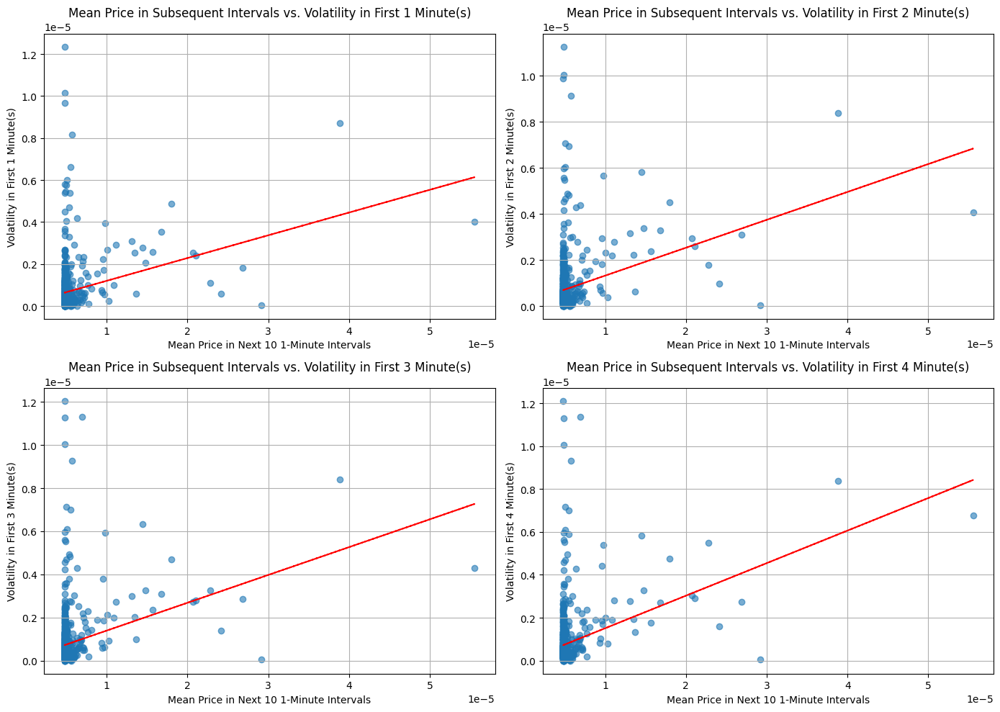

In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load and preprocess the dataset
df = pd.read_csv('/Users/sterling/Documents/simpleDmca/PumpFun/pump-fun-bot/data/transactions1000.csv')
df['Date'] = pd.to_datetime(df['Date'])

# Sort by Mint and Date
df_sorted = df.sort_values(by=['Mint', 'Date'])

# Calculate time deltas from the first trade
df_sorted['TimeDelta'] = df_sorted.groupby('Mint')['Date'].transform(lambda x: (x - x.min()).dt.total_seconds())

# Define different initial intervals for the first 1, 2, 3, and 4 minutes
interval_durations = [60, 120, 180, 240]
volatility_dict = {}

for duration in interval_durations:
    initial_interval = df_sorted[df_sorted['TimeDelta'] <= duration]
    volatility_dict[f'Volatility_First_{duration//60}min'] = initial_interval.groupby('Mint')['THS USD Price'].std()

# Define intervals for the next 10 1-minute periods (600 seconds total)
next_10_intervals = df_sorted[(df_sorted['TimeDelta'] > 240) & (df_sorted['TimeDelta'] <= 840)]

next_10_intervals['Interval'] = ((next_10_intervals['TimeDelta'] - 241) // 60).astype(int)

# Calculate mean price for the next 10 1-minute intervals
interval_prices = next_10_intervals.groupby(['Mint', 'Interval'])['THS USD Price'].mean()
mean_next_prices = interval_prices.groupby('Mint').mean()

# Create a DataFrame to store results
results = {'Mean_Price_Next_Intervals': mean_next_prices}

# Add volatility data to results
results.update(volatility_dict)

# Create analysis DataFrame
analysis_df = pd.DataFrame(results).dropna()

# Plot
plt.figure(figsize=(14, 10))

for i, duration in enumerate(interval_durations):
    plt.subplot(2, 2, i + 1)
    plt.scatter(analysis_df['Mean_Price_Next_Intervals'], analysis_df[f'Volatility_First_{duration//60}min'], alpha=0.6)
    plt.title(f'Mean Price in Subsequent Intervals vs. Volatility in First {duration//60} Minute(s)')
    plt.xlabel('Mean Price in Next 10 1-Minute Intervals')
    plt.ylabel(f'Volatility in First {duration//60} Minute(s)')
    plt.grid(True)

    # Fit line
    z = np.polyfit(analysis_df['Mean_Price_Next_Intervals'], analysis_df[f'Volatility_First_{duration//60}min'], 1)
    p = np.poly1d(z)
    plt.plot(analysis_df['Mean_Price_Next_Intervals'], p(analysis_df['Mean_Price_Next_Intervals']), "r--")

    # Calculate correlation
    correlation = analysis_df.corr().loc[f'Volatility_First_{duration//60}min', 'Mean_Price_Next_Intervals']
    print(f"Correlation for first {duration//60} minute(s): {correlation:.2f}")

plt.tight_layout()
plt.show()

In [66]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE

# Load and preprocess the primary dataset
df = pd.read_csv('/Users/sterling/Documents/simpleDmca/PumpFun/pump-fun-bot/data/transactions1000.csv')
df['Date'] = pd.to_datetime(df['Date'])

# Sort within each mint
df_sorted = df.sort_values(by=['Mint', 'Date'])

# Calculate time deltas from the first trade
df_sorted['TimeDelta'] = df_sorted.groupby('Mint')['Date'].transform(lambda x: (x - x.min()).dt.total_seconds())

# Function to calculate features for each interval
def calculate_features(df, duration):
    interval_data = df[df['TimeDelta'] <= duration]
    buy_data = interval_data[interval_data['Type'] == 'buy']
    
    # Calculate buy volume
    buy_volume = buy_data.groupby('Mint')['THS Amount'].sum()
    # Calculate price volatility
    price_volatility = interval_data.groupby('Mint')['THS USD Price'].std()
    
    return buy_volume, price_volatility

# Calculate features for 1, 2, 3, and 4 minute intervals
interval_durations = [60, 120, 180, 240]
features_dict = {}

for duration in interval_durations:
    buy_volume, price_volatility = calculate_features(df_sorted, duration)
    features_dict[f'Buy_Volume_{duration//60}min'] = buy_volume
    features_dict[f'Volatility_{duration//60}min'] = price_volatility

# Calculate the target: mean price in the next 10 minutes > price_max in the first 4 minutes
next_10_intervals = df_sorted[(df_sorted['TimeDelta'] > 240) & (df_sorted['TimeDelta'] <= 840)]
mean_next_10_price = next_10_intervals.groupby('Mint')['THS USD Price'].mean()
first_4min_max = df_sorted[df_sorted['TimeDelta'] <= 240].groupby('Mint')['THS USD Price'].max()
targets = mean_next_10_price > first_4min_max
targets.fillna(False, inplace=True)

# Prepare features DataFrame
features = pd.DataFrame(features_dict).dropna()
features['Label'] = features.index.map(targets).astype(int)

# Extract feature matrix (X) and labels (y)
X = features.drop(columns=['Label']).reset_index(drop=True)
y = features['Label'].reset_index(drop=True)

# Handle missing values by imputation
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

# Handle class imbalance using SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_scaled, y)

# Train the Random Forest model with balanced data
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_resampled, y_resampled)

# Load and preprocess the test dataset
test_df = pd.read_csv('/Users/sterling/Documents/simpleDmca/PumpFun/pump-fun-bot/data/transactions100.csv')
test_df['Date'] = pd.to_datetime(test_df['Date'])

# Sort within each mint
test_sorted = test_df.sort_values(by=['Mint', 'Date'])

# Calculate time deltas from the first trade
test_sorted['TimeDelta'] = test_sorted.groupby('Mint')['Date'].transform(lambda x: (x - x.min()).dt.total_seconds())

# Function to calculate test features
def calculate_test_features(df, duration):
    interval_data = df[df['TimeDelta'] <= duration]
    buy_data = interval_data[interval_data['Type'] == 'buy']
    
    # Calculate buy volume
    buy_volume = buy_data.groupby('Mint')['THS Amount'].sum()
    # Calculate price volatility
    price_volatility = interval_data.groupby('Mint')['THS USD Price'].std()
    
    return buy_volume, price_volatility

# Calculate test features
test_features_dict = {}
for duration in interval_durations:
    buy_volume, price_volatility = calculate_test_features(test_sorted, duration)
    test_features_dict[f'Buy_Volume_{duration//60}min'] = buy_volume
    test_features_dict[f'Volatility_{duration//60}min'] = price_volatility

# Prepare test features DataFrame
test_features = pd.DataFrame(test_features_dict).dropna().reset_index()
X_test = test_features.drop(columns=['Mint'])

# Impute and scale test features
X_test_imputed = imputer.transform(X_test)
X_test_scaled = scaler.transform(X_test_imputed)

# Predict with a custom threshold
probabilities = model.predict_proba(X_test_scaled)[:, 1]
threshold = 0.5  # Adjust threshold based on your needs
predictions = (probabilities > threshold).astype(int)

# Combine predictions with probabilities
results = pd.DataFrame({
    'Mint': test_features['Mint'],
    'Prediction': predictions,
    'Probability': probabilities
})

# Calculate actual labels for evaluation
real_labels = test_sorted[test_sorted['TimeDelta'] <= 180].groupby('Mint')['THS USD Price'].max() > \
               test_sorted[test_sorted['TimeDelta'] > 840].groupby('Mint')['THS USD Price'].mean()

real_labels.fillna(False, inplace=True)
results['Actual'] = results['Mint'].map(real_labels).astype(int)
results['Correct'] = results['Prediction'] == results['Actual']

# Export CSV
results.to_csv('/Users/sterling/Documents/simpleDmca/PumpFun/pump-fun-bot/data/predictions_output.csv', index=False)

# Print summary statistics
accuracy = results['Correct'].mean()
print(f"Model Accuracy: {accuracy:.2f}")
print("\nConfusion Matrix:\n", confusion_matrix(results['Actual'], results['Prediction']))
print("\nClassification Report:\n", classification_report(results['Actual'], results['Prediction']))

ValueError: Can only compare identically-labeled Series objects

In [ ]:
Useful Statistical Methods & Indicators
1. Clustering Algorithms
What: Use unsupervised clustering (e.g., K-Means, DBSCAN, Hierarchical) on coin/project features to group coins with similar transactional/market behaviors.
Features to use: Holder concentration, owner’s share of supply, initial trading intensity, LP (liquidity pool) percentages, transaction burst patterns.
Why: Known rugs may cluster together; new coins close to these ‘risky’ clusters are more likely rugs.
2. Anomaly Detection
What: Statistical anomaly/outlier detection techniques (IsolationForest, Z-score, IQR) on transaction velocity, liquidity changes, or owner activity.
Why: Sudden abnormal spikes in withdrawals/remove liquidity/diverse sell-off often predate rugs.
3. Regression Analysis
What: Use regression to model the relationship between pre-rug characteristics (e.g., volume spikes, LP ratios, owner holdings) and rug-pull price (e.g., price at last big sell, sudden 98% drop, etc.).
Why: Allows you to estimate at what price level (range) rugs typically occur for similar coins.
4. Markov Chains/Hidden Markov Models (HMM)
What: Model state transitions in project lifecycles: launch → accumulate volume → owner sells → LP withdraw → death.
Why: Estimate probability of entering ‘rug state’ at each tick, conditioned on current observed metrics.
5. Survival Analysis
What: Time-to-event (here, rug pull) analysis; use Cox Proportional Hazards or Kaplan-Meier estimators.
Why: Find the likelihood of rug given certain features at launch or at different price levels.
Key Features from Transaction Data
Owner Holdings Through Time: Is the deployer reducing supply? Still holds >30% even after launch?
Concentration of Holders: Gini coefficient, Herfindahl Index—high concentration is risky.
Initial Liquidity Added vs. Total Market Cap
Buy/Sell Pressure Ratio: Sudden shifts (i.e., big sells clustered before a liquidity removal) are a red flag.
LP Add/Remove Events: Timestamp, size, frequency.
Transaction Frequency Spikes: Bursts followed by stagnation or mass sells is a classic rug pattern.
Honeypot Checks: Blacklist/whitelist tactics, unexpected token transfer failures.
Transfer to Exchanges: Outflow of large % of tokens to CEXes or mixing services.
Innovative Indicators to Derive:
“Deployer Stash Ratio” = (Current deployer balance / Total supply)
“Liquidity Coverage Ratio” = (Liquidity pool size / Market cap)
“Order Book Anomaly Index” = (Sum of top N sell orders / Average volume per minute) — spikes before rugs
“Transaction Velocity Drop” = (Rolling window std-dev of tx count) — drops sharply at rugs
“Social Sentiment Lag” = (Negative social sentiment spike lag vs on-chain dump observation)
“Early Whale Dump”: Detect big wallets selling within X mins/hours of launch
Python Example: Clustering & Feature Extraction
Here’s a high-level code skeleton using pandas, scikit-learn, and numpy:

import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.ensemble import IsolationForest

# Assume df is a dataframe of coin activity with features as above.
features = ['owner_holding_pct', 'liquidity_pct', 'buy_sell_ratio',
            'top5_holder_concentration', 'lp_add_remove_spikes',
            'mean_tx_per_min', 'gini_coefficient']

X = df[features]
X_scaled = StandardScaler().fit_transform(X)

# 1. Clustering: Grouping similar coins
kmeans = KMeans(n_clusters=5)
clusters = kmeans.fit_predict(X_scaled)
df['cluster'] = clusters

# 2. Anomaly Detection: Spot possible rugs
isf = IsolationForest(contamination=0.05)
df['rug_anomaly_score'] = isf.fit_predict(X_scaled)

# 3. Statistical Outlier for Owner Holdings
df['owner_holding_zscore'] = (df['owner_holding_pct'] - df['owner_holding_pct'].mean()) / df['owner_holding_pct'].std()

# 4. Predict rug price with regression (if labeled rug pull data is present)
from sklearn.linear_model import LinearRegression
# y = rug price / market cap at rug event; X as above
reg = LinearRegression().fit(X_scaled, df['rug_pull_price'])
df['estimated_rug_price'] = reg.predict(X_scaled)

# 5. Survival Analysis for rug-pull timing
from lifelines import CoxPHFitter
cox_df = df[['duration_until_rug', 'event_observed'] + features]  # event_observed = 1 if rug, 0 otherwise
cph = CoxPHFitter().fit(cox_df, 'duration_until_rug', event_col='event_observed')
df['rug_pull_risk'] = cph.predict_partial_hazard(df[features])
Actionable Steps:
Gather labeled past rug pulls + normal coins (needed to train supervised methods).
Extract feature vectors as above for each coin.
Cluster for pattern similarity. Use anomaly detection for one-off rugs.
Train regression/survival models to estimate where and when rugs happen.
Deploy real-time monitoring, flagging new coins as they mirror “danger zone” behaviors.
Tip:
Deploy stand-alone alerts for abrupt changes in owner/token distribution, liquidity removal, or suspicious sell/buy pattern clusters—these are excellent immediate warning signals.

Let me know if you want more detail on code for specific metrics, or help with data collection/parsing from Solana/Pump.fun APIs!